In [1]:
#import my libraries
import pandas as pd
import numpy as np
import sqlite3
import seaborn as sns
import warnings
#warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings('ignore')

In [2]:
# command to show all columns
pd.set_option('display.max_columns', None)

In [3]:
# read my database by creating a connection
con = sqlite3.connect('accident_data_v1.0.0_2023.db')

In [4]:
# read in accident table
query = 'SELECT * FROM accident'
acident_1 = pd.read_sql(query, con)

In [5]:
# read in vehicle table
query_1 = 'SELECT * FROM vehicle'
vehicle_1 = pd.read_sql(query_1, con)

In [6]:
# read in casualty table
query_2 = 'SELECT * FROM casualty'
casualty_1 = pd.read_sql(query_2, con)

In [7]:
# read in lsoa table
query_3 = 'SELECT * FROM lsoa'
lsoa_1 = pd.read_sql(query_3, con)

### 3a. The age of the oldest driver/rider in the casualty table

In [8]:
# using sql command to extract the age of the oldest driver/rider in the casualty table

query_casualty = 'SELECT max(age_of_casualty) AS Age_of_the_oldest_driver_rider  FROM casualty WHERE casualty_class = 1'
casualty_result = pd.read_sql(query_casualty, con)
casualty_result 

,Age_of_the_oldest_driver_rider
0,101


### 3b. The total number of vehicle_type = 19 vehicles in the vehicle table

In [9]:
query_vehicle = 'SELECT COUNT(*) AS total_number_vehicle_type FROM vehicle WHERE vehicle_type = 19'
vehicle_result = pd.read_sql(query_vehicle, con)
vehicle_result

,total_number_vehicle_type
0,47458


### 3c. The sex of driver, sex of casualty, speed limit and age of vehicle for accidents in all the lower layer super output area (LSOA) regions of Kingston Upon Hull. You will need to do a JOIN on the lsoa table and some of the other tables. In the LSOA table, the codes are in the column lsoa01cd and the place names are in column lsoa01nm. Put the results in a pandas data frame.

In [10]:
my_query = '''
SELECT Veh.sex_of_driver, Cas.sex_of_casualty, Acc.speed_limit, Veh.age_of_vehicle,LS.lsoa01nm
FROM ACCIDENT Acc, VEHICLE Veh, CASUALTY Cas,LSOA LS
WHERE Acc.accident_index = Veh.accident_index AND
Acc.accident_index = Cas.accident_index AND
Acc.lsoa_of_accident_location = LS.lsoa01cd AND
LS.lsoa01nm LIKE '%kingston upon Hull%'
LIMIT 20;

'''
my_result = pd.read_sql(my_query, con)

In [11]:
my_result.head()

,sex_of_driver,sex_of_casualty,speed_limit,age_of_vehicle,lsoa01nm
0,1,1,30,13,Kingston upon Hull 028C
1,1,1,30,9,Kingston upon Hull 028C
2,3,1,30,6,Kingston upon Hull 029A
3,3,2,30,6,Kingston upon Hull 029A
4,1,1,30,11,Kingston upon Hull 029A


## MAIN ASSESSMENT - 001_CWRK: Project Report

### 1. Are there significant hours of the day, and days of the week, on which accidents occur

In [12]:
#filters out 2020 accident_database tables
accident_df = acident_1[acident_1['accident_year'] == 2020]
vehicle_df = vehicle_1[vehicle_1['accident_year'] == 2020]
casualty_df = casualty_1[casualty_1['accident_year'] == 2020]

In [13]:
#explore the first 5 rows ot accident table of 2020 to ensure that only 2020 is showing
accident_df.head()

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location
370153,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,1,04/02/2020,3,09:00,10,E09000032,E09000032,6,0,6,20,0,-1,0,-1,9,9,1,9,9,0,0,1,3,2,E01004576
370154,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,2,27/04/2020,2,13:55,9,E09000022,E09000022,3,3036,6,20,9,2,6,0,0,4,1,1,1,0,0,1,1,2,E01003034
370155,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,1,01/01/2020,4,01:25,1,E09000033,E09000033,5,0,6,30,3,1,6,0,0,0,4,1,2,0,0,1,1,2,E01004726
370156,2020010228006,2020,010228006,538676.0,184371.0,-0.001683,51.541210,1,2,1,1,01/01/2020,4,01:50,17,E09000025,E09000025,3,11,6,30,0,-1,0,-1,0,4,4,1,1,0,0,1,1,2,E01003617
370157,2020010228011,2020,010228011,529324.0,181286.0,-0.137592,51.515704,1,3,1,2,01/01/2020,4,02:25,1,E09000033,E09000033,3,40,6,30,3,4,5,0,0,0,4,1,1,0,0,1,1,2,E01004763


### 1a. Significant hours of the day on which accident occurs

In [14]:
#sort in ascending order
accident_df.groupby('time')['accident_index'].count().sort_values(ascending=False)

time
17:00    862
16:00    785
15:00    774
17:30    746
18:00    739
        ... 
04:39      1
04:58      1
04:31      1
03:36      1
04:33      1
Name: accident_index, Length: 1438, dtype: int64

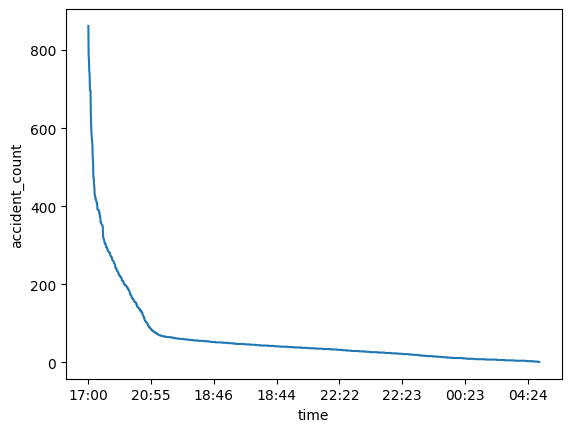

In [15]:
#import my library for visualization
import matplotlib.pyplot as plt

accident_df.groupby('time')['accident_index'].count().sort_values(ascending=False).plot()

# Labels the y-axis
plt.ylabel('accident_count')

# visualize the plot
plt.show()


- This showed that more accident occured between the hours of 17.00 while accident occurance happened around 00.23 and 04.24
- However, I will explore further by extracting the top 20 accidents to enable me to get more insight

In [16]:
# Exploring further by extracting the top 20 accidents to enable me to get more insight
q1_top_10 = accident_df.groupby('time')['accident_index'].count().reset_index()

In [17]:
q1_top_10.rename(columns = {'accident_index': 'number_of_accidents'}, inplace = True)

In [18]:
#sort in ascending order
q1_top_10.sort_values(by = 'number_of_accidents', ascending=False)[:10]

,time,number_of_accidents
1018,17:00,862
958,16:00,785
898,15:00,774
1048,17:30,746
1078,18:00,739
838,14:00,699
988,16:30,697
928,15:30,697
1108,18:30,629
778,13:00,605


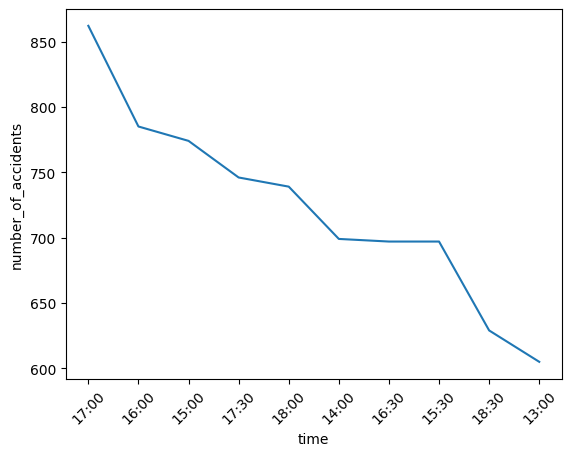

In [19]:
top_10_plot = q1_top_10.sort_values(by = 'number_of_accidents', ascending=False)[:10]
sns.lineplot(data = top_10_plot, x = 'time', y = 'number_of_accidents')
plt.xticks(rotation=45);

- The plot showed that accidents occured significantly between the hours of 16.00 and 17.00 with 17.00 recording the highest occurances

### 1b. Significant days of the week on which accident occurs

In [20]:
accident_df['date'] = pd.to_datetime(accident_df['date'], dayfirst=True, format = '%d/%m/%Y')

In [21]:
accident_df['day_week'] = accident_df['date'].dt.day_name()

In [22]:
accident_df.groupby('day_week')['accident_index'].count().sort_values(ascending=False)

day_week
Friday       14889
Thursday     14056
Wednesday    13564
Tuesday      13267
Monday       12772
Saturday     12336
Sunday       10315
Name: accident_index, dtype: int64

<Axes: xlabel='day_week'>

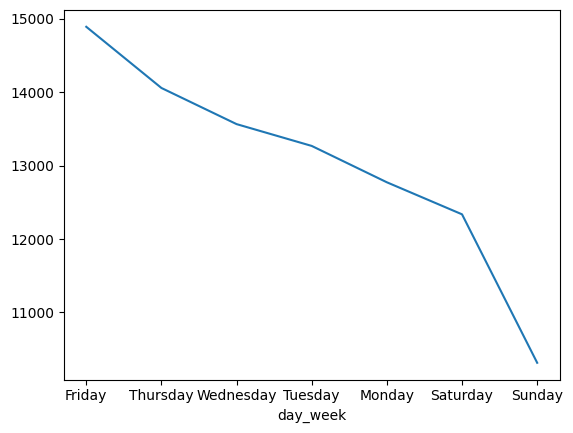

In [23]:
#visualize the days of the week in which accident occurs
accident_df.groupby('day_week')['accident_index'].count().sort_values(ascending=False).plot()

- Fridays and Thursdays records the highest accident occurances with Friday been the highest and Sundays been the lowest

### 2. For motorbikes, are there significant hours of the day, and days of the week, on which accidents occur? We suggest a focus on: Motorcycle 125cc and under, Motorcycle over 125cc and up to 500cc, and Motorcycle over 500cc

In [24]:
#observe my vehicle-df table
vehicle_df.head()

,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
681716,681716,2020010219808,2020,010219808,1,9,9,5,1,5,0,0,0,0,0,0,4,9,6,2,32,6,1968,2,6,AUDI Q5,4,1
681717,681717,2020010220496,2020,010220496,1,9,0,4,2,6,0,2,0,0,0,0,1,1,2,1,45,7,1395,1,2,AUDI A1,7,1
681718,681718,2020010228005,2020,010228005,1,9,0,18,-1,-1,0,0,0,0,0,0,1,1,6,3,-1,-1,-1,-1,-1,-1,-1,-1
681719,681719,2020010228006,2020,010228006,1,8,0,18,1,5,0,0,0,0,0,0,1,1,1,1,44,7,1798,8,8,TOYOTA PRIUS,2,1
681720,681720,2020010228011,2020,010228011,1,9,0,18,3,7,9,1,0,0,0,0,1,1,6,1,20,4,2993,2,4,BMW 4 SERIES,-1,-1


In [25]:
#focusing on the unique vehicle type
vehicle_df.vehicle_type.unique()

array([ 9,  8,  3,  2, 11,  1, 90, 19,  4,  5, 21, 97, 20, 98, 10, 17, 23,
       22, 18, 16], dtype=int64)

#### We need to select  3, 4 and 5 class from the accident form. We will need to put this in a list and select a dataframe for it

In [26]:
#create a list for the 3 classes
cat_vehicle = [3,4,5]
sub_veh1 = vehicle_df[vehicle_df['vehicle_type'].isin(cat_vehicle)]
sub_veh1

,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
681728,681728,2020010228020,2020,010228020,1,3,0,3,7,3,0,1,0,0,0,0,2,1,6,1,37,7,114,1,5,YAMAHA XC115,8,1
681749,681749,2020010228086,2020,010228086,1,3,0,18,7,3,9,0,0,11,0,0,1,1,6,3,-1,-1,-1,-1,-1,-1,-1,-1
681752,681752,2020010228097,2020,010228097,2,3,0,18,1,5,0,0,0,0,0,0,3,1,6,1,20,4,125,1,4,PEUGEOT TWEET 125,6,1
681774,681774,2020010228148,2020,010228148,1,3,0,14,5,1,0,2,0,0,0,0,1,1,6,1,20,4,125,1,0,HONDA GLR 125,2,1
681793,681793,2020010228207,2020,010228207,1,3,0,99,9,9,99,9,9,99,9,99,1,1,6,1,22,5,125,1,9,HONDA WW125,7,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
848911,848911,2020991010130,2020,991010130,2,3,0,14,7,3,0,0,0,0,0,0,1,1,6,1,47,8,124,1,17,-1,5,1
849008,849008,2020991011809,2020,991011809,2,3,0,5,7,3,0,2,0,0,0,0,1,1,2,1,61,9,124,1,4,-1,3,1
849017,849017,2020991012311,2020,991012311,1,3,0,18,8,4,0,1,0,4,0,0,1,1,1,1,35,6,125,1,3,-1,5,1
849020,849020,2020991012353,2020,991012353,2,4,0,18,6,2,0,1,2,0,0,0,1,1,5,1,48,8,250,1,5,-1,2,1


In [27]:
sub_veh1.vehicle_type.unique()

array([3, 4, 5], dtype=int64)

In [28]:
#combine vehicle data and accident data
acc_veh_df = pd.merge(accident_df, sub_veh1, on = 'accident_index') # on is used when the names are the same

In [29]:
acc_veh_df.head()

,accident_index,accident_year_x,accident_reference_x,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,local_authority_ons_district,local_authority_highway,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,day_week,vehicle_index,accident_year_y,accident_reference_y,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,skidding_and_overturning,hit_object_in_carriageway,vehicle_leaving_carriageway,hit_object_off_carriageway,first_point_of_impact,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,2020010228020,2020,010228020,529718.0,192342.0,-0.127840,51.614971,1,3,2,1,2020-01-01,4,03:25,32,E09000010,E09000010,3,406,3,30,6,2,3,406,0,5,4,1,1,0,0,1,1,2,E01001530,Wednesday,681728,2020,010228020,1,3,0,3,7,3,0,1,0,0,0,0,2,1,6,1,37,7,114,1,5,YAMAHA XC115,8,1
1,2020010228086,2020,010228086,531043.0,176304.0,-0.114680,51.470537,1,3,1,1,2020-01-01,4,14:00,9,E09000022,E09000022,6,0,6,20,0,-1,0,-1,0,0,1,1,1,0,0,1,1,2,E01003186,Wednesday,681749,2020,010228086,1,3,0,18,7,3,9,0,0,11,0,0,1,1,6,3,-1,-1,-1,-1,-1,-1,-1,-1
2,2020010228097,2020,010228097,528428.0,179923.0,-0.150994,51.503659,1,3,2,1,2020-01-01,4,14:37,1,E09000033,E09000033,3,4202,3,30,0,-1,0,-1,0,0,1,1,1,0,0,1,1,2,E01004761,Wednesday,681752,2020,010228097,2,3,0,18,1,5,0,0,0,0,0,0,3,1,6,1,20,4,125,1,4,PEUGEOT TWEET 125,6,1
3,2020010228148,2020,010228148,518467.0,185248.0,-0.292651,51.553691,1,3,1,1,2020-01-01,4,19:05,28,E09000005,E09000005,3,404,6,30,3,2,3,4089,2,4,4,1,1,0,0,1,1,2,E01000635,Wednesday,681774,2020,010228148,1,3,0,14,5,1,0,2,0,0,0,0,1,1,6,1,20,4,125,1,0,HONDA GLR 125,2,1
4,2020010228207,2020,010228207,527038.0,170583.0,-0.174362,51.420033,1,3,2,1,2020-01-01,4,14:29,22,E09000024,E09000024,6,0,6,20,99,9,6,0,0,0,1,1,1,0,0,1,3,2,E01003371,Wednesday,681793,2020,010228207,1,3,0,99,9,9,99,9,9,99,9,99,1,1,6,1,22,5,125,1,9,HONDA WW125,7,1


### 2a. significant motorbikes accidents on hours of the day

<Axes: xlabel='time'>

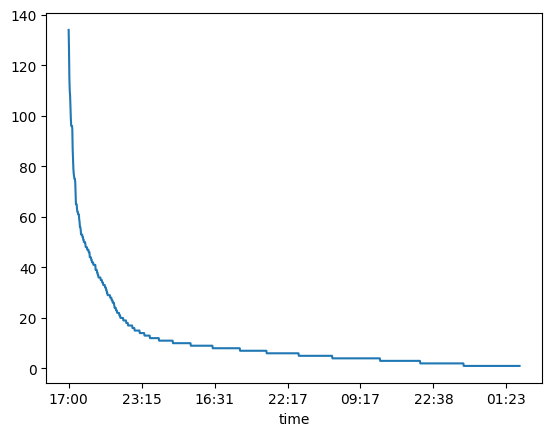

In [30]:
acc_veh_df.groupby('time')['accident_index'].count().sort_values(ascending=False).plot()

- This showed that the motorbykes recorded more accident arround 17.00

<Axes: xlabel='time'>

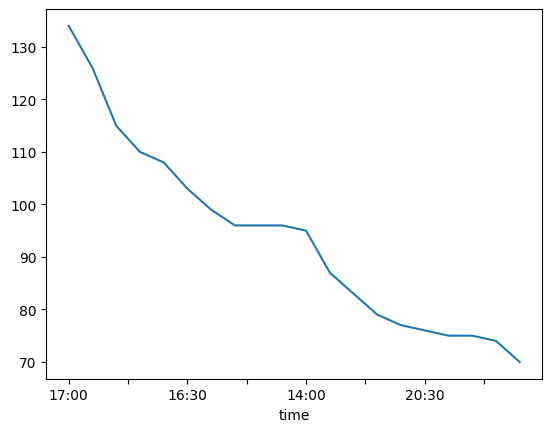

In [31]:
acc_veh_df.groupby('time')['accident_index'].count().sort_values(ascending=False)[:20].plot()

- This corroborates that there significant motorbyke accident by 17.00

### 2b. significant motorbikes accidents on week days

<Axes: xlabel='day_week'>

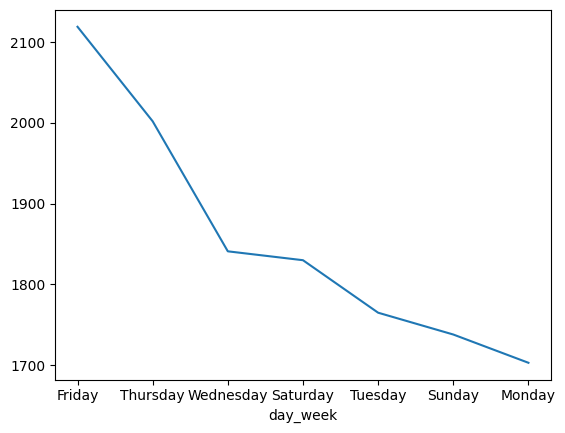

In [32]:
acc_veh_df.groupby('day_week')['accident_index'].count().sort_values(ascending=False).plot()

- These showed that there are significant motorbyke accidents on Fridays. 
- This points that most accident recorded are significantly caused by Motorbykes(Motorcycle 125cc and under, Motorcycle over 125cc and up to 500cc, and Motorcycle over 500cc) 

### 3. For pedestrians involved in accidents, are there significant hours of the day, and days of the week, on which they are more likely to be involved?

In [33]:
# filtering outthe casualty class. We are interested in the Pedestaral which is the 3 class
casualty_df.head()

,casualty_index,accident_index,accident_year,accident_reference,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
484748,484748,2020010219808,2020,010219808,1,1,3,1,31,6,3,9,5,0,0,0,0,1,4
484749,484749,2020010220496,2020,010220496,1,1,3,2,2,1,3,1,1,0,0,0,0,1,2
484750,484750,2020010220496,2020,010220496,1,2,3,2,4,1,3,1,1,0,0,0,0,1,2
484751,484751,2020010228005,2020,010228005,1,1,3,1,23,5,3,5,9,0,0,0,0,1,3
484752,484752,2020010228006,2020,010228006,1,1,3,1,47,8,2,4,1,0,0,0,0,1,3


In [34]:
pedestrians = casualty_df[casualty_df['casualty_class'] == 3] # pedestarian

In [35]:
#combine vehicle data and accident data
ped_combined = pd.merge(accident_df, pedestrians, on = 'accident_index')

#### 3a.Significant Hours of Accident for pedestarians of the day

In [36]:
ped_combined.groupby('time')['accident_index'].count().sort_values(ascending=False)

time
15:30    188
15:00    164
16:00    153
18:00    152
17:00    150
        ... 
03:46      1
02:11      1
19:34      1
06:53      1
01:43      1
Name: accident_index, Length: 1264, dtype: int64

<Axes: xlabel='time'>

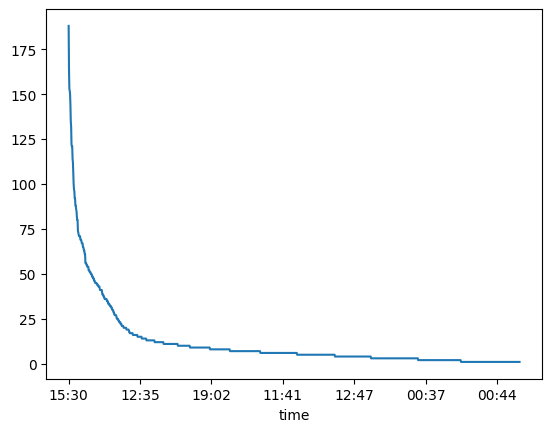

In [37]:
ped_combined.groupby('time')['accident_index'].count().sort_values(ascending=False).plot()

- We have more accident occurances for Pedestarant by 15.30

<Axes: xlabel='time'>

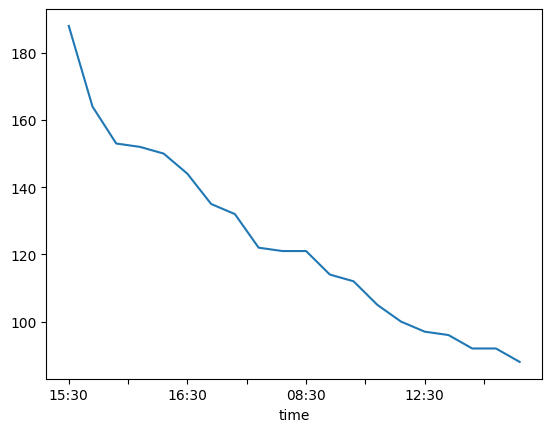

In [38]:
#exploring further showing the top 20
ped_combined.groupby('time')['accident_index'].count().sort_values(ascending=False)[:20].plot()

- That still point that significant accidents occured for pedestrarians between the hours of 15.30 and 16.00 with 15.30 recording the highest number of accidents

#### 3b.Significant Day of Accident for pedestarians of the week

<Axes: xlabel='day_week'>

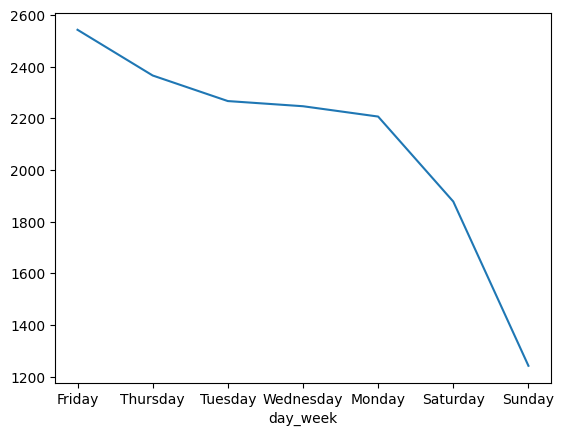

In [39]:
ped_combined.groupby('day_week')['accident_index'].count().sort_values(ascending=False).plot()

- This showed that significant day of the week for pedestarian accidents is Fridays
- Friday has shown to be the dyas of the week that most accidents occured for both motobykes and pedestratrians. Further insisghts and suggestions needs to focus on the hours of 17.00 - 16.00 (motobykes) and Fridays.
- For Pedestrans, focus should be focused on hours of 15.30 and Fridays.

### 4 Using the apriori algorithm, explore the impact of selected variables on accident severity.

#### Selecting possible features needed for the apriori algorith design

- Accident: accident_index, accident_severity, number_vehicle, number_of_casualty, road_type, speed_limit, light_conditions,
    weather_conditions, road_surface-conditions, lsoa_of_accident_location, police_force
- Vehicle: accident_index, vehicle_type, sex_of_driver, age_of_driver, engine_capacity_cc, age_of-vehicle
- Casualty: accident_index, casualty_class, sex_of_casualty, pedestrian_location

In [40]:
#list of features required
accident_features = ['accident_index', 'accident_severity','number_of_vehicles','number_of_casualties', 'road_type', 'speed_limit', 'light_conditions', 'weather_conditions',
                     'road_surface_conditions', 'lsoa_of_accident_location','police_force']
vehicle_features = ['accident_index', 'vehicle_type', 'sex_of_driver', 'age_of_driver','engine_capacity_cc','age_of_vehicle']
casualty_features = ['accident_index', 'casualty_class', 'sex_of_casualty','age_of_casualty', 'pedestrian_location']

In [41]:
# applying subsecting on the original data based on the selcted features
accident_df_new = accident_df[accident_features]
vehicle_df_new = vehicle_df[vehicle_features]
casualty_df_new = casualty_df[casualty_features]

In [42]:
# exploring the first 5 rows of accident_df_new
accident_df_new.head()

,accident_index,accident_severity,number_of_vehicles,number_of_casualties,road_type,speed_limit,light_conditions,weather_conditions,road_surface_conditions,lsoa_of_accident_location,police_force
370153,2020010219808,3,1,1,6,20,1,9,9,E01004576,1
370154,2020010220496,3,1,2,6,20,1,1,1,E01003034,1
370155,2020010228005,3,1,1,6,30,4,1,2,E01004726,1
370156,2020010228006,2,1,1,6,30,4,1,1,E01003617,1
370157,2020010228011,3,1,2,6,30,4,1,1,E01004763,1


In [43]:
vehicle_df_new.head()

,accident_index,vehicle_type,sex_of_driver,age_of_driver,engine_capacity_cc,age_of_vehicle
681716,2020010219808,9,2,32,1968,6
681717,2020010220496,9,1,45,1395,2
681718,2020010228005,9,3,-1,-1,-1
681719,2020010228006,8,1,44,1798,8
681720,2020010228011,9,1,20,2993,4


In [44]:
casualty_df_new.head()

,accident_index,casualty_class,sex_of_casualty,age_of_casualty,pedestrian_location
484748,2020010219808,3,1,31,9
484749,2020010220496,3,2,2,1
484750,2020010220496,3,2,4,1
484751,2020010228005,3,1,23,5
484752,2020010228006,3,1,47,4


In [45]:
# merge the dataset - Note that we can merge only two tables in python hence the action of merging accident and and vehicle table
merge_acc_veh = accident_df_new.merge(vehicle_df_new, on = 'accident_index')

# merging the accident and vehicle (merge_acc_veh) with casualty_df_new

merge_all = merge_acc_veh.merge(casualty_df_new, on = 'accident_index')

In [46]:

# The columns to drop
columns_to_drop = ['accident_index', 'number_of_casualties', 'lsoa_of_accident_location','engine_capacity_cc', 'age_of_driver','sex_of_casualty','age_of_vehicle']

# Drop the specified columns and assign the resulting DataFrame to 'x'
x = merge_all.drop(columns=columns_to_drop)


- These features were dropped becacause Apriori alogorithms requires categorical variables and these variables dropped  are continous variables and more like identifiers.

In [47]:
#encoding my dataset
def feature_encode(x):
    if x <= 1:
        return 0
    else:
        return 1

In [48]:
x_encoded = x.applymap(feature_encode)

In [49]:
x_encoded

,accident_severity,number_of_vehicles,road_type,speed_limit,light_conditions,weather_conditions,road_surface_conditions,police_force,vehicle_type,sex_of_driver,casualty_class,age_of_casualty,pedestrian_location
0,1,0,1,1,0,1,1,0,1,1,1,1,1
1,1,0,1,1,0,0,0,0,1,0,1,1,0
2,1,0,1,1,0,0,0,0,1,0,1,1,0
3,1,0,1,1,1,0,1,0,1,1,1,1,1
4,1,0,1,1,1,0,0,0,1,0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
220430,1,1,1,1,0,0,0,1,1,0,0,1,0
220431,1,1,1,1,0,0,0,1,1,0,0,1,0
220432,1,1,1,1,0,0,0,1,1,1,0,1,0
220433,1,1,1,1,0,0,0,1,0,0,0,1,0


### Implementation of Apriori Algorithm

In [50]:
#import library for Apriori algorithm
from mlxtend.frequent_patterns import apriori, association_rules

In [51]:
items_frequency = apriori(x_encoded, min_support = 0.5, use_colnames=True)

C:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


In [52]:
items_frequency

,support,itemsets
0,0.980806,(accident_severity)
1,0.867285,(number_of_vehicles)
2,0.943661,(road_type)
3,0.999936,(speed_limit)
4,0.792787,(police_force)
...,...,...
122,0.574215,"(police_force, number_of_vehicles, age_of_casu..."
123,0.607812,"(police_force, number_of_vehicles, speed_limit..."
124,0.670012,"(police_force, speed_limit, age_of_casualty, a..."
125,0.587892,"(police_force, number_of_vehicles, speed_limit..."


In [53]:
#performs cardinality of the variables
items_frequency['Cardinality'] = items_frequency['itemsets'].apply(lambda x: len(x))
items_frequency

,support,itemsets,Cardinality
0,0.980806,(accident_severity),1
1,0.867285,(number_of_vehicles),1
2,0.943661,(road_type),1
3,0.999936,(speed_limit),1
4,0.792787,(police_force),1
...,...,...,...
122,0.574215,"(police_force, number_of_vehicles, age_of_casu...",6
123,0.607812,"(police_force, number_of_vehicles, speed_limit...",6
124,0.670012,"(police_force, speed_limit, age_of_casualty, a...",6
125,0.587892,"(police_force, number_of_vehicles, speed_limit...",6


- This is a visualization of the cardinality of the features

In [54]:
#trim down the feature to obtain the variables that helps to form the rules
items_frequency[items_frequency['Cardinality'] > 1]

,support,itemsets,Cardinality
7,0.851952,"(accident_severity, number_of_vehicles)",2
8,0.924685,"(accident_severity, road_type)",2
9,0.980743,"(accident_severity, speed_limit)",2
10,0.774809,"(accident_severity, police_force)",2
11,0.902366,"(accident_severity, vehicle_type)",2
...,...,...,...
122,0.574215,"(police_force, number_of_vehicles, age_of_casu...",6
123,0.607812,"(police_force, number_of_vehicles, speed_limit...",6
124,0.670012,"(police_force, speed_limit, age_of_casualty, a...",6
125,0.587892,"(police_force, number_of_vehicles, speed_limit...",6


In [55]:
items_frequency.head()

,support,itemsets,Cardinality
0,0.980806,(accident_severity),1
1,0.867285,(number_of_vehicles),1
2,0.943661,(road_type),1
3,0.999936,(speed_limit),1
4,0.792787,(police_force),1


In [56]:
#pd.set_option

In [57]:
# Finding the association rules
var_rules = association_rules(items_frequency, metric = 'confidence', min_threshold=0.8)

In [58]:
var_rules.sample(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
259,"(number_of_vehicles, speed_limit)","(accident_severity, vehicle_type)",0.867267,0.902366,0.778139,0.897231,0.994309,-0.004453,0.950034,-0.041335
122,"(vehicle_type, number_of_vehicles)",(road_type),0.792860,0.943661,0.748720,0.944328,1.000707,0.000529,1.011976,0.003408
158,"(vehicle_type, road_type)",(speed_limit),0.872058,0.999936,0.871999,0.999932,0.999996,-0.000004,0.939139,-0.000032
543,"(accident_severity, vehicle_type, road_type, s...",(number_of_vehicles),0.853762,0.867285,0.734035,0.859765,0.991330,-0.006420,0.946378,-0.056433
629,"(number_of_vehicles, accident_severity, police...",(vehicle_type),0.670742,0.920802,0.618600,0.922262,1.001585,0.000979,1.018776,0.004807
737,"(road_type, speed_limit)","(age_of_casualty, accident_severity, vehicle_t...",0.943598,0.880659,0.833448,0.883266,1.002960,0.002460,1.022331,0.052327
669,"(number_of_vehicles, speed_limit)","(age_of_casualty, accident_severity, vehicle_t...",0.867267,0.880659,0.759557,0.875806,0.994489,-0.004209,0.960923,-0.040075
422,"(age_of_casualty, speed_limit)","(number_of_vehicles, road_type)",0.976097,0.815696,0.796475,0.815979,1.000347,0.000276,1.001538,0.014512
343,"(accident_severity, road_type, police_force)",(age_of_casualty),0.731408,0.976161,0.718384,0.982193,1.006179,0.004412,1.338750,0.022866
565,"(age_of_casualty, number_of_vehicles, speed_li...","(accident_severity, road_type)",0.846708,0.924685,0.781296,0.922746,0.997903,-0.001642,0.974897,-0.013525


In [59]:

# Filter rules with 'accident_severity' as consequent
severity_rules = var_rules[var_rules['consequents'].apply(lambda x: len(x) == 1 and 'accident_severity' in x)]

# Sort rules by lift and select top 5
top_severity_rules = severity_rules.sort_values('lift', ascending=False).head(5)

top_severity_rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
1,(number_of_vehicles),(accident_severity),0.867285,0.980806,0.851952,0.982320,1.001544,0.001313,1.085646,0.011615
45,"(number_of_vehicles, speed_limit)",(accident_severity),0.867267,0.980806,0.851934,0.982320,1.001543,0.001313,1.085623,0.011610
58,"(age_of_casualty, number_of_vehicles)",(accident_severity),0.846726,0.980806,0.831492,0.982009,1.001226,0.001018,1.066854,0.007991
264,"(age_of_casualty, number_of_vehicles, speed_li...",(accident_severity),0.846708,0.980806,0.831474,0.982009,1.001226,0.001018,1.066831,0.007988
54,"(vehicle_type, number_of_vehicles)",(accident_severity),0.792860,0.980806,0.778157,0.981456,1.000663,0.000515,1.035047,0.003197


### Row 0 - Rule 1
- When the number of vehicles involved in an accident is known, this association rule reveals that it has a high predictive link with accident severity, allowing it to be predicted with 98.2% confidence. The conviction of 1.086 implies that the number of vehicles raises the likelihood of greater severity by 8.6%. The near 1 lift, on the other hand, shows minimal link between the number of cars actually affecting or creating increased severity, despite the fact that both variables co-occur very frequently, in 85.2% of records. Overall, the number of cars is effective for predicting, although it is not highly related to severity.

### Row 45 - Rule 2
- This rule suggests that the speed limit and the number of vehicles involved can be used to forecast accident severity with 98.2% accuracy, even though these variables are not substantially connected with creating increased severity (lift of 1.001543). Based on a conviction rate of 1.085623, the antecedents raise the severity probability by 8.6%. Their co-occurrence with accident severity, on the other hand, is highly prevalent (85.2% support). Overall, the antecedents are highly predictive but have a modest connection with severity.

### Row 59 - Rule 3
- This association rule reveals that the age of the casualty and the number of vehicles involved have a high 98.2% confidence in predicting accident severity, yet the lift of 1.001226 indicates that these antecedents are not connected with creating increased severity. According to the conviction metric, antecedents only raise severity probability by 6.7%. This antecedent-consequent combination, on the other hand, is a fairly common pattern, occuring in 83.1% of entries.

### Row 265 - Rule 4
- This rule demonstrates that the age of the casualty, the number of cars, and the speed restriction may reliably forecast accident severity with 98.2% confidence, despite the fact that the lift of 1.001226 suggests that they are not connected with creating greater severity themselves. Based on conviction, the antecedents only raise the severity probability by 6.7%. However, this antecedent-consequent pattern appears in 83.1% of the data.

### Row 54 - Rule 5
- This rule reveals that vehicle type and number of vehicles have a high 98.1% confidence in forecasting accident severity, yet the lift of 1.000663 indicates that these antecedents are not connected with creating increased severity. According to the conviction metric, antecedents barely raise severity probability by 3.5%. However, this combination of antecedents and consequences happens rather frequently, accounting for 77.8% of all recordings.


### Exercise 5 - Clustering

### Filter the chosen region's database
- Required regions:
    - Kingston upon Hull
    - Humberside
    - East Riding of Yorkshire

In [60]:
lsoa_1.head()

,objectid,lsoa01cd,lsoa01nm,lsoa01nmw,shape__area,shape__length,globalid
0,1,E01000001,City of London 001A,City of London 001A,1.298652e+05,2635.772001,68cc6127-1008-4fbe-a16c-78fb089a7c43
1,2,E01000002,City of London 001B,City of London 001B,2.284189e+05,2707.986202,937edbc3-c1bf-4d35-b274-b0a1480a7c09
2,3,E01000003,City of London 001C,City of London 001C,5.905477e+04,1224.774479,2686dcaf-10b9-4736-92af-4788d4feaa69
3,4,E01000004,City of London 001D,City of London 001D,2.544551e+06,10718.466240,3c493140-0b3f-4b9a-b358-22011dc5fb89
4,5,E01000005,City of London 001E,City of London 001E,1.895782e+05,2275.809358,b569093d-788d-41be-816c-d6d7658b2311


### Clustering of the Regions

In [61]:
#Merge lsoa_1 with merge_all before filtering the regions
main_merged = merge_all.merge(lsoa_1,left_on = 'lsoa_of_accident_location', right_on = 'lsoa01cd')

In [62]:
lsoa_1_new = main_merged[
    main_merged['lsoa01nm'].str.contains('Kingston upon Hull') | 
    main_merged['lsoa01nm'].str.contains('East Riding of Yorkshire') |
    (main_merged['police_force'] == 16)
]

In [63]:
#creating a column that contains the required 3 regions

def regiongroup(region):
    if region.startswith('Kingston upon Hull'):
        return 'Hull'
    elif region.startswith('East Riding of Yorkshire'):
        return 'Yorkshire'
    else:
        return 'Humberside'

In [64]:
lsoa_1_new['Region'] = lsoa_1_new['lsoa01nm'].apply(lambda x: regiongroup(x))

In [65]:
# To do the clustering, I have to drop the identifiers. These features are not neccessary for my clustering.

drop_cols_new = ['accident_index', 'lsoa01cd', 'lsoa01nm', 
                     'lsoa_of_accident_location', 'lsoa01nmw', 'shape__area', 'shape__length', 'globalid','objectid' ]
main_data = lsoa_1_new.drop(drop_cols_new, axis = 1)

In [66]:
main_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3985 entries, 83493 to 87477
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   accident_severity        3985 non-null   int64 
 1   number_of_vehicles       3985 non-null   int64 
 2   number_of_casualties     3985 non-null   int64 
 3   road_type                3985 non-null   int64 
 4   speed_limit              3985 non-null   int64 
 5   light_conditions         3985 non-null   int64 
 6   weather_conditions       3985 non-null   int64 
 7   road_surface_conditions  3985 non-null   int64 
 8   police_force             3985 non-null   int64 
 9   vehicle_type             3985 non-null   int64 
 10  sex_of_driver            3985 non-null   int64 
 11  age_of_driver            3985 non-null   int64 
 12  engine_capacity_cc       3985 non-null   int64 
 13  age_of_vehicle           3985 non-null   int64 
 14  casualty_class           3985 non-n

In [67]:
#import Python libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans


In [68]:
#list of features required
accident_new_feat = ['accident_index', 'accident_severity','number_of_vehicles','number_of_casualties', 'road_type', 'speed_limit', 'light_conditions', 'weather_conditions',
                     'road_surface_conditions', 'lsoa_of_accident_location','police_force','latitude','longitude']
vehicle_new_feat = ['accident_index', 'vehicle_type', 'sex_of_driver', 'age_of_driver','engine_capacity_cc','age_of_vehicle']
casualty_new_feat = ['accident_index', 'casualty_class', 'sex_of_casualty','age_of_casualty', 'pedestrian_location']

In [69]:
# applying subsecting on the original data based on the selcted features
accident_new = accident_df[accident_new_feat]
vehicle_new = vehicle_df[vehicle_new_feat]
casualty_new = casualty_df[casualty_new_feat]

In [70]:
# merge the dataset - Note that we can merge only two tables in python hence the action of merging accident and and vehicle table
merge_acc_veh_new = accident_new.merge(vehicle_new, on = 'accident_index')

# merging the accident and vehicle (merge_acc_veh) with casualty_df_new

mergeddall = merge_acc_veh_new.merge(casualty_new, on = 'accident_index')

In [71]:
#Merge lsoa_1 with merge_all before filtering the regions
main_merged = mergeddall.merge(lsoa_1,left_on = 'lsoa_of_accident_location', right_on = 'lsoa01cd')

In [72]:
lsoa_1_new = main_merged[
    main_merged['lsoa01nm'].str.contains('Kingston upon Hull') | 
    main_merged['lsoa01nm'].str.contains('East Riding of Yorkshire') |
    (main_merged['police_force'] == 16)
]

In [73]:
#creating a column that contains the required 3 regions

def regiongroup(region):
    if region.startswith('Kingston upon Hull'):
        return 'Hull'
    elif region.startswith('East Riding of Yorkshire'):
        return 'Yorkshire'
    else:
        return 'Humberside'

In [74]:
lsoa_1_new['Region'] = lsoa_1_new['lsoa01nm'].apply(lambda x: regiongroup(x))

In [75]:
# To do the clustering, I have to drop the identifiers. These features are not neccessary for my clustering.

drop_cols_new = ['accident_index', 'lsoa01cd', 'lsoa01nm', 
                     'lsoa_of_accident_location', 'lsoa01nmw', 'shape__area', 'shape__length', 'globalid','objectid' ]
main_data = lsoa_1_new.drop(drop_cols_new, axis = 1)

In [76]:
#check my main dataframe columns
main_data.columns

Index(['accident_severity', 'number_of_vehicles', 'number_of_casualties',
       'road_type', 'speed_limit', 'light_conditions', 'weather_conditions',
       'road_surface_conditions', 'police_force', 'latitude', 'longitude',
       'vehicle_type', 'sex_of_driver', 'age_of_driver', 'engine_capacity_cc',
       'age_of_vehicle', 'casualty_class', 'sex_of_casualty',
       'age_of_casualty', 'pedestrian_location', 'Region'],
      dtype='object')

In [77]:
# Selecting the relevant features for clustering
features = main_data[['accident_severity', 'number_of_vehicles', 'road_type', 'speed_limit', 
                      'light_conditions', 'weather_conditions', 'road_surface_conditions',
                      'latitude', 'longitude']]


In [78]:
# Perform one-hot encoding for the 'Region' column
region_encoded = pd.get_dummies(main_data['Region'], drop_first=True)

In [79]:
# Concatenate the encoded 'Region' column with the features
features_encoded = pd.concat([features, region_encoded], axis=1)

In [80]:
# Function to determine the optimal number of clusters using the Elbow method
def determine_optimal_clusters(data, max_clusters):
    distortions = []
    for k in range(1, max_clusters + 1):
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(data)
        distortions.append(kmeans.inertia_)

    # Plotting the Elbow curve
    plt.figure(figsize=(8, 6))
    plt.plot(range(1, max_clusters + 1), distortions, marker='o')
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Sum of Squared Distances (Inertia)')
    plt.title('Elbow Method to Determine Optimal k')
    plt.grid(True)
    plt.show()

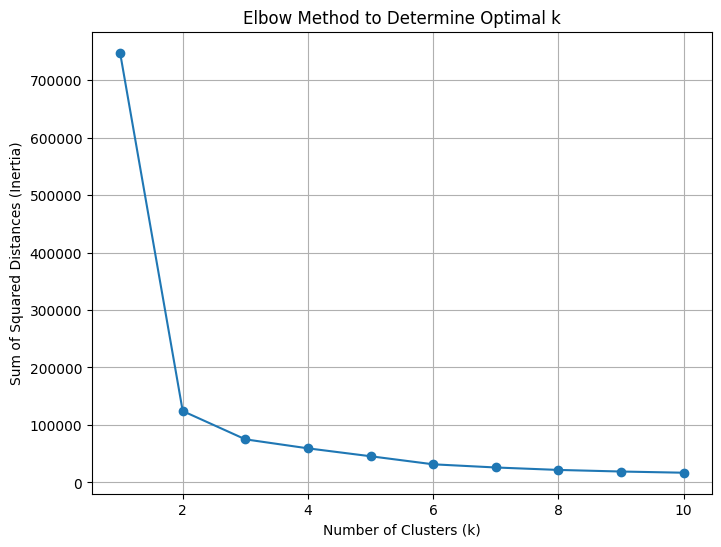

In [81]:
# Determines the optimal number of clusters making use of the Elbow method (set to a maximum of 10 clusters)
max_clusters = 10
determine_optimal_clusters(features_encoded, max_clusters)


- I have my best elbow between 2, 3 and 4. I will choose 3.

## Clustering For Region 'Hull (Kingston Upon Hull)'

   labels_Kmeans  Number of Accidents
0              0                  334
1              1                  508
2              2                  437


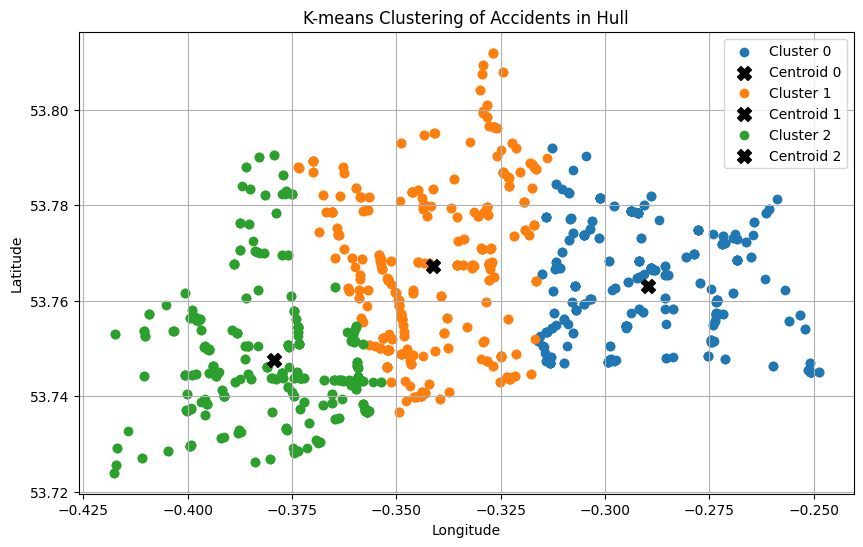

In [82]:

# extract data for the 'Hull' region
hull_data = main_data[main_data['Region'] == 'Hull']

# feature selection for hull region clustering
features_encoded = hull_data[['longitude', 'latitude']].values

# Perform K-means clustering using 3 clusters
num_clusters = 3
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
hull_data['labels_Kmeans'] = kmeans.fit_predict(features_encoded)

# obtain cluster centroids
cluster_centers = kmeans.cluster_centers_

# calcualte and print the number of accidents per cluster
num_accidents = hull_data.groupby('labels_Kmeans').size().reset_index(name='Number of Accidents')
print(num_accidents)

# visualize the clustering results using scatter plot
plt.figure(figsize=(10, 6))
for cluster_label in range(num_clusters):
    cluster_data = hull_data[hull_data['labels_Kmeans'] == cluster_label]
    plt.scatter(cluster_data['longitude'], cluster_data['latitude'], label=f'Cluster {cluster_label}')
    plt.scatter(cluster_centers[cluster_label, 0], cluster_centers[cluster_label, 1], c='black', marker='X', s=100, label=f'Centroid {cluster_label}')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('K-means Clustering of Accidents in Hull')
plt.legend()
plt.grid(True)
plt.show()


- For cluster 0, we have a total of 334 accidents, Cluster 1 records 508 accidents while cluster 2 records 437 accidents making it 1279 accident distribution for region of Hull (Kingston Upon Hull) 

#### Map distribution of the accidents in Hull

In [83]:
import folium
from folium.plugins import MarkerCluster

hull_data = main_data[main_data['Region'] == 'Hull']

# obtain the mean latitude and longitude of accidents
mean_latitude = hull_data['latitude'].mean()
mean_longitude = hull_data['longitude'].mean()

# Create the folium map centered on the mean latitude and longitude
accident_map = folium.Map(location=[mean_latitude, mean_longitude], zoom_start=10)

# Create a MarkerCluster for the accidents
marker_cluster = MarkerCluster().add_to(accident_map)

# Add markers for each accident
for index, row in hull_data.iterrows():
    popup_text = f"Accident Severity: {row['accident_severity']}"

    # Determine the marker color based on the accident severity
    if row['accident_severity'] == 'Fatal':
        marker_color = 'red'
    elif row['accident_severity'] == 'Serious':
        marker_color = 'orange'
    else:
        marker_color = 'green'

    folium.Marker([row['latitude'], row['longitude']], popup=popup_text, icon=folium.Icon(color=marker_color)).add_to(marker_cluster)

# Display the map
accident_map


 - Graphical representation of the accident distribution in Kingston Upon Hull region showing 1279 accidents in all. When you click on the map, it will give you more breakdown of the accidents according to different communities in Hull

### Clustering For Region 'Yorkshire (East Riding Of Yorkshire)

   labels_Kmeans  Number of Accidents
0              0                  321
1              1                  524
2              2                  343


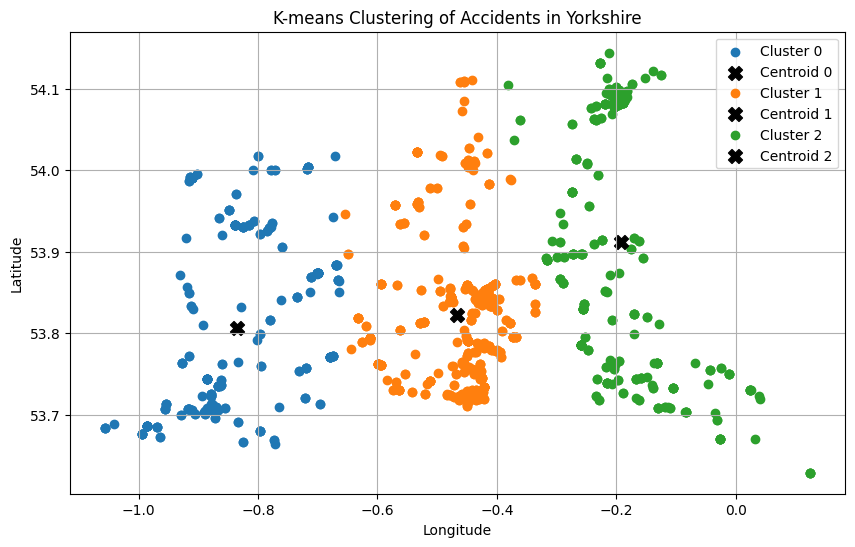

In [84]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Filter data for the 'Yorkshire' region
yorkshire_data = main_data[main_data['Region'] == 'Yorkshire']

# Select features for clustering
features_encoded = yorkshire_data[['longitude', 'latitude']].values

# Perform K-means clustering with 3 clusters
num_clusters = 3
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
yorkshire_data['labels_Kmeans'] = kmeans.fit_predict(features_encoded)

# Get the cluster centroids
cluster_centers = kmeans.cluster_centers_

# Print the number of accidents per cluster
num_accidents = yorkshire_data.groupby('labels_Kmeans').size().reset_index(name='Number of Accidents')
print(num_accidents)

# Scatter plot to visualize the clustering results
plt.figure(figsize=(10, 6))
for cluster_label in range(num_clusters):
    cluster_data = yorkshire_data[yorkshire_data['labels_Kmeans'] == cluster_label]
    plt.scatter(cluster_data['longitude'], cluster_data['latitude'], label=f'Cluster {cluster_label}')
    plt.scatter(cluster_centers[cluster_label, 0], cluster_centers[cluster_label, 1], c='black', marker='X', s=100, label=f'Centroid {cluster_label}')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('K-means Clustering of Accidents in Yorkshire')
plt.legend()
plt.grid(True)
plt.show()


- Cluster 0 in Yorkshire captured accident distribution of 321, cluster 1 recorded 524 while cluster recorded 343. This showed a total of 1,188 accident distribution in Yorkshire 

### Map distribution of the accident in Yorkshire

In [85]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster

# Filter data for the 'Yorkshire' region
yorkshire_data = main_data[main_data['Region'] == 'Yorkshire']

# Calculate the mean latitude and longitude of accidents
mean_latitude = yorkshire_data['latitude'].mean()
mean_longitude = yorkshire_data['longitude'].mean()

# Create the folium map centered on the mean latitude and longitude
accident_map = folium.Map(location=[mean_latitude, mean_longitude], zoom_start=10)

# Create a MarkerCluster for the accidents
marker_cluster = MarkerCluster().add_to(accident_map)

# Add markers for each accident
for index, row in yorkshire_data.iterrows():
    popup_text = f"Accident Severity: {row['accident_severity']}"

    # Determine the marker color based on the accident severity
    if row['accident_severity'] == 'Fatal':
        marker_color = 'red'
    elif row['accident_severity'] == 'Serious':
        marker_color = 'orange'
    else:
        marker_color = 'green'

    folium.Marker([row['latitude'], row['longitude']], popup=popup_text, icon=folium.Icon(color=marker_color)).add_to(marker_cluster)

# Display the map
accident_map


- The map showed accident distribution in Yorkshire which is 1,188

### Clustering For Humberside

   labels_Kmeans  Number of Accidents
0              0                  699
1              1                  580
2              2                  239


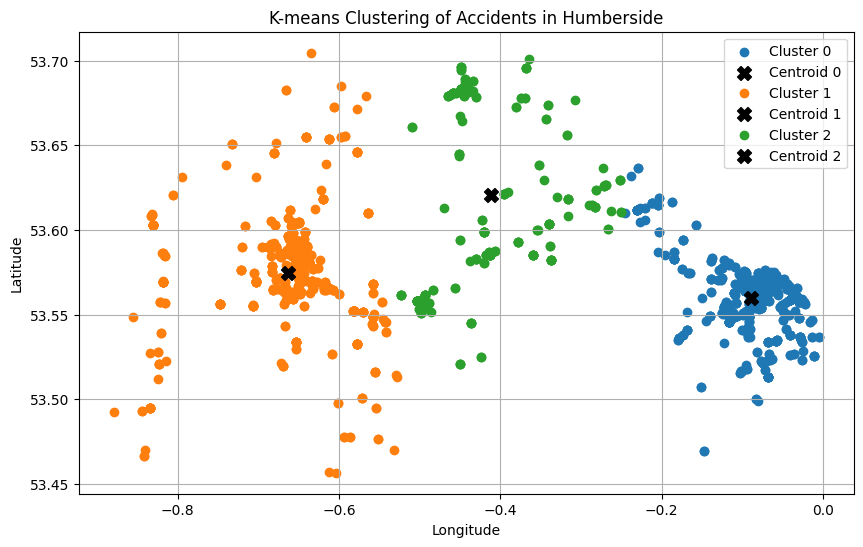

In [86]:
import pandas as pd
from sklearn.cluster import KMeans

# Load your dataset (assuming you have it loaded as 'main_data')
# Replace 'main_data' with your actual data

# Filter data for the 'Humberside' region
humberside_data = main_data[main_data['Region'] == 'Humberside']

# Select features for clustering
features_encoded = humberside_data[['longitude', 'latitude']].values

# Perform K-means clustering with 3 clusters
num_clusters = 3
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
humberside_data['labels_Kmeans'] = kmeans.fit_predict(features_encoded)

# Get the cluster centroids
cluster_centers = kmeans.cluster_centers_

# Print the number of accidents per cluster
num_accidents = humberside_data.groupby('labels_Kmeans').size().reset_index(name='Number of Accidents')
print(num_accidents)

# Scatter plot to visualize the clustering results
plt.figure(figsize=(10, 6))
for cluster_label in range(num_clusters):
    cluster_data = humberside_data[humberside_data['labels_Kmeans'] == cluster_label]
    plt.scatter(cluster_data['longitude'], cluster_data['latitude'], label=f'Cluster {cluster_label}')
    plt.scatter(cluster_centers[cluster_label, 0], cluster_centers[cluster_label, 1], c='black', marker='X', s=100, label=f'Centroid {cluster_label}')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('K-means Clustering of Accidents in Humberside')
plt.legend()
plt.grid(True)
plt.show()


- Cluster 0 recorded accident distribution of 699, while cluster 1 recorded accident distribution of 580. Cluster 2 on the other hand recorded accident distribution of 2339
- In todatl, the accident distribution in Humberside is 1,518 in all

### Map distribution of the accident in Humberside

In [87]:
import folium
from folium.plugins import MarkerCluster

# Filter data for the 'Humberside' region
humberside_data = main_data[main_data['Region'] == 'Humberside']

# Calculate the mean latitude and longitude of accidents
mean_latitude = humberside_data['latitude'].mean()
mean_longitude = humberside_data['longitude'].mean()

# Create the folium map centered on the mean latitude and longitude
accident_map = folium.Map(location=[mean_latitude, mean_longitude], zoom_start=10)

# Create a MarkerCluster for the accidents
marker_cluster = MarkerCluster().add_to(accident_map)

# Add markers for each accident
for index, row in humberside_data.iterrows():
    popup_text = f"Accident Severity: {row['accident_severity']}"

    # Determine the marker color based on the accident severity
    if row['accident_severity'] == 'Fatal':
        marker_color = 'red'
    elif row['accident_severity'] == 'Serious':
        marker_color = 'orange'
    else:
        marker_color = 'green'

    folium.Marker([row['latitude'], row['longitude']], popup=popup_text, icon=folium.Icon(color=marker_color)).add_to(marker_cluster)

# Display the map
accident_map


- The map showed that Humberside recorded a total of 1,518 accident distributions in the year 2020

### Map showing accident distribution of the 3 Regions (Hull, Yorkshire and Humberside)

In [88]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster

# Load your dataset (assuming you have it loaded as 'main_data')
# Replace 'main_data' with your actual data

# Filter data for the 'Hull' region
hull_data = main_data[main_data['Region'] == 'Hull']

# Filter data for the 'Yorkshire' region
yorkshire_data = main_data[main_data['Region'] == 'Yorkshire']

# Filter data for the 'Humberside' region
humberside_data = main_data[main_data['Region'] == 'Humberside']

# Create the folium map centered on a reasonable location
accident_map = folium.Map(location=[53.75, -0.5], zoom_start=8)

# Create a MarkerCluster for each region's accidents
marker_cluster_hull = MarkerCluster().add_to(accident_map)
marker_cluster_yorkshire = MarkerCluster().add_to(accident_map)
marker_cluster_humberside = MarkerCluster().add_to(accident_map)

# Add markers for Hull accidents
for index, row in hull_data.iterrows():
    popup_text = f"Accident Severity: {row['accident_severity']}"

    # Determine the marker color based on the accident severity
    if row['accident_severity'] == 'Fatal':
        marker_color = 'red'
    elif row['accident_severity'] == 'Serious':
        marker_color = 'orange'
    else:
        marker_color = 'green'

    folium.Marker([row['latitude'], row['longitude']], popup=popup_text, icon=folium.Icon(color=marker_color)).add_to(marker_cluster_hull)

# Add markers for Yorkshire accidents
for index, row in yorkshire_data.iterrows():
    popup_text = f"Accident Severity: {row['accident_severity']}"

    # Determine the marker color based on the accident severity
    if row['accident_severity'] == 'Fatal':
        marker_color = 'red'
    elif row['accident_severity'] == 'Serious':
        marker_color = 'orange'
    else:
        marker_color = 'green'

    folium.Marker([row['latitude'], row['longitude']], popup=popup_text, icon=folium.Icon(color=marker_color)).add_to(marker_cluster_yorkshire)

# Add markers for Humberside accidents
for index, row in humberside_data.iterrows():
    popup_text = f"Accident Severity: {row['accident_severity']}"

    # Determine the marker color based on the accident severity
    if row['accident_severity'] == 'Fatal':
        marker_color = 'red'
    elif row['accident_severity'] == 'Serious':
        marker_color = 'orange'
    else:
        marker_color = 'green'

    folium.Marker([row['latitude'], row['longitude']], popup=popup_text, icon=folium.Icon(color=marker_color)).add_to(marker_cluster_humberside)

# Display the map
accident_map


- The maps shows accident distributions and location of Hull, Yorkshire and Humberside for the year 2020.
- Hull recorded 1279, Yorkshire recorded 1188 while Humberside recorded 1518 accidents.
- In all the regions accounted for 3985 accidents in the year 2020

### 6. Using outlier detection methods, identify unusual entries in your data set. Should you keep these entries in your data? 

### Outliers Detections

#### Detecting Outliers in the Hull Region using LOF

In [89]:

# Drop the 'Region' column from hull_data
hull_data = hull_data.drop(columns=['Region'])


In [90]:
hull_data

,accident_severity,number_of_vehicles,number_of_casualties,road_type,speed_limit,light_conditions,weather_conditions,road_surface_conditions,police_force,latitude,longitude,vehicle_type,sex_of_driver,age_of_driver,engine_capacity_cc,age_of_vehicle,casualty_class,sex_of_casualty,age_of_casualty,pedestrian_location
83493,3,2,1,6,30,1,1,1,16,53.744936,-0.393424,9,1,24,1248,11,1,1,24,0
83494,3,2,1,6,30,1,1,1,16,53.744936,-0.393424,19,1,48,1968,5,1,1,24,0
83495,3,2,1,3,30,1,1,2,16,53.744520,-0.400627,9,2,34,1997,4,1,1,61,0
83496,3,2,1,3,30,1,1,2,16,53.744520,-0.400627,1,1,61,-1,-1,1,1,61,0
83497,3,2,1,6,30,4,1,1,16,53.744482,-0.400523,9,2,22,1461,4,1,1,59,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87454,3,2,4,6,30,4,1,2,16,53.781490,-0.301160,9,1,36,1461,6,2,1,8,0
87461,3,2,1,6,20,1,1,2,16,53.753141,-0.307734,9,1,49,1991,9,1,1,25,0
87462,3,2,1,6,20,1,1,2,16,53.753141,-0.307734,9,1,25,1560,9,1,1,25,0
87469,3,2,1,6,30,4,1,1,16,53.773648,-0.318108,9,3,-1,1995,9,1,1,35,0


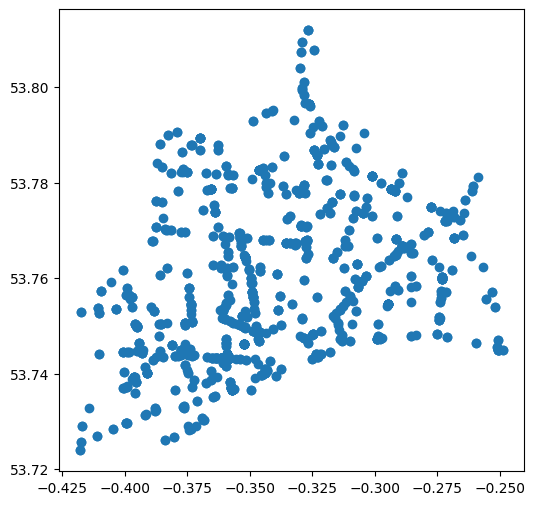

In [91]:
plt.figure(figsize=(6,6))
plt.scatter(hull_data['longitude'],hull_data['latitude'])

In [92]:
from numpy import quantile, where 
from sklearn.neighbors import LocalOutlierFactor

In [93]:
hull_out = hull_data[['longitude', 'latitude']]
model = LocalOutlierFactor(n_neighbors=30, contamination=0.1)
y_pred = model.fit_predict(hull_out)
LOF_Scores = model.negative_outlier_factor_
LOF_pred = pd.Series(y_pred).replace([-1, 1], [1, 0])
LOF_pred.index = hull_out.index
LOF_anomalies = hull_out[LOF_pred == 1]

In [94]:
y_pred

array([1, 1, 1, ..., 1, 1, 1])

In [95]:
LOF_anomalies

,longitude,latitude
83567,-0.321773,53.773447
83568,-0.321773,53.773447
83591,-0.328032,53.777858
83592,-0.328032,53.777858
83958,-0.344794,53.768032
...,...,...
87381,-0.365360,53.740502
87382,-0.365360,53.740502
87415,-0.410842,53.726991
87416,-0.410842,53.726991


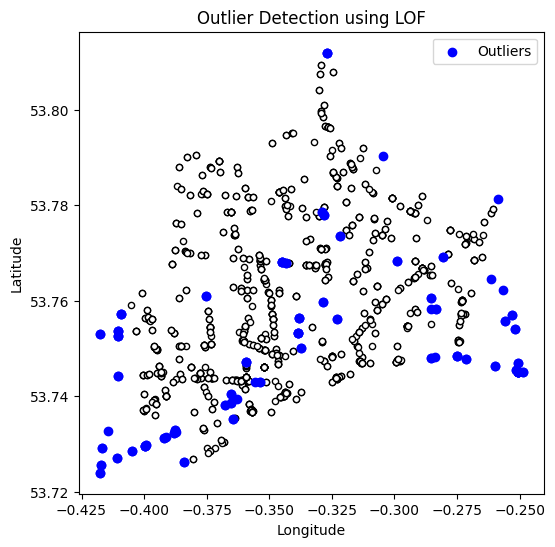

In [96]:
plt.figure(figsize=(6, 6))
plt.scatter(hull_out['longitude'], hull_out['latitude'], c='white', s=20, edgecolor='k')
plt.scatter(LOF_anomalies['longitude'], LOF_anomalies['latitude'], c='blue', label='Outliers')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Outlier Detection using LOF')
plt.legend()
plt.show()

- The markers in blue are the outliers for Hull Region. 

#### Applyring IsolationForest For Hull region

In [97]:
from sklearn.ensemble import IsolationForest

In [98]:

# Create a random number generator
ranst = np.random.RandomState(0)

hull_outliers = hull_data[['longitude', 'latitude']]
# Create an instance of the IsolationForest class with specified parameters and fit it to your data
model_Isolf = IsolationForest(max_samples=100, random_state=ranst, contamination=0.05)
model_Isolf = model_Isolf.fit(hull_outliers)

# Predict anomalies using the trained model and transform the labels for easier interpretation
if_anomalies = model_Isolf.predict(hull_outliers)
if_anomalies = pd.Series(if_anomalies).replace([-1, 1], [1, 0])

# Reset the index of hull_data to ensure alignment with if_anomalies
hull_outliers_reset = hull_outliers.reset_index(drop=True)

# Filter out the detected anomalies from the original data
if_anomalies = hull_outliers_reset[if_anomalies == 1]


In [99]:
if_anomalies

,longitude,latitude
166,-0.324394,53.807867
167,-0.324394,53.807867
168,-0.328268,53.800963
169,-0.328268,53.800963
184,-0.250524,53.745048
...,...,...
1199,-0.253136,53.757024
1200,-0.252017,53.754032
1201,-0.252017,53.754032
1257,-0.410842,53.726991


- The IsolationForest identified 63 outliers as against 128 identified by LOF

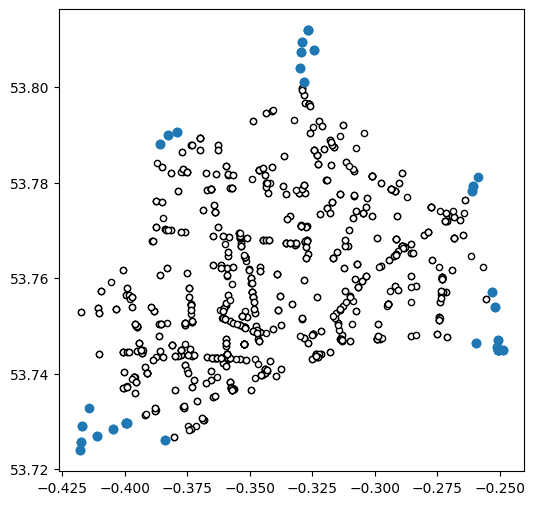

In [100]:
#Visualize the outliers for Hull region
plt.figure(figsize=(6,6))
plt.scatter(hull_outliers['longitude'], hull_outliers['latitude'], c='white', s=20, edgecolor='k')
plt.scatter(if_anomalies['longitude'],if_anomalies['latitude'])

- This visualizes the outliers. The outliers are more defined here as they are found majorly at the edges

### LOF Outlier Detection For East Riding of Yorkshire

In [101]:
york_out = yorkshire_data[['longitude', 'latitude']]
model_lof_york = LocalOutlierFactor(n_neighbors=30, contamination=0.1)
y_pred_lof_york = model_lof_york.fit_predict(york_out)
LOF_Scores = model_lof_york.negative_outlier_factor_
LOF_pred_lof_york = pd.Series(y_pred_lof_york).replace([-1, 1], [1, 0])
LOF_pred_lof_york.index = york_out.index
LOF_anomalies_york = york_out[LOF_pred_lof_york == 1]

In [102]:
y_pred_lof_york

array([1, 1, 1, ..., 1, 1, 1])

In [103]:
LOF_anomalies_york

,longitude,latitude
83671,-0.361794,53.864510
83672,-0.361794,53.864510
83673,-0.368461,53.864753
83674,-0.368461,53.864753
83971,-0.832815,53.690712
...,...,...
87346,-0.139122,54.121760
87428,-1.055770,53.682905
87429,-1.055770,53.682905
87430,-1.055770,53.682905


- I have a total of 119 outliers using Local Outlier detector algorithm

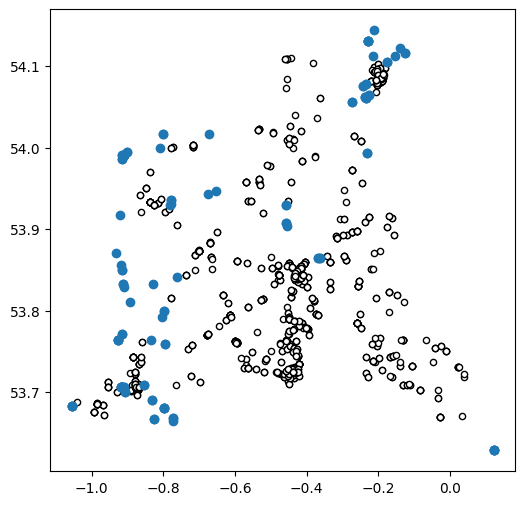

In [104]:
#Visualize the outliers for Yorkshire region
plt.figure(figsize=(6,6))
plt.scatter(york_out['longitude'], york_out['latitude'], c='white', s=20, edgecolor='k')
plt.scatter(LOF_anomalies_york['longitude'],LOF_anomalies_york['latitude'])

- The data point in blue colors are the outliers

### Detecting Outliers in the Yorkshire Region using IsolationForest

In [105]:
yorkshire_data

,accident_severity,number_of_vehicles,number_of_casualties,road_type,speed_limit,light_conditions,weather_conditions,road_surface_conditions,police_force,latitude,longitude,vehicle_type,sex_of_driver,age_of_driver,engine_capacity_cc,age_of_vehicle,casualty_class,sex_of_casualty,age_of_casualty,pedestrian_location,Region
83655,3,2,3,6,40,1,1,2,16,53.859763,-0.335628,9,2,29,-1,-1,1,2,29,0,Yorkshire
83656,3,2,3,6,40,1,1,2,16,53.859763,-0.335628,9,2,29,-1,-1,1,1,29,0,Yorkshire
83657,3,2,3,6,40,1,1,2,16,53.859763,-0.335628,9,2,29,-1,-1,2,2,29,0,Yorkshire
83658,3,2,3,6,40,1,1,2,16,53.859763,-0.335628,9,1,29,1997,2,1,2,29,0,Yorkshire
83659,3,2,3,6,40,1,1,2,16,53.859763,-0.335628,9,1,29,1997,2,1,1,29,0,Yorkshire
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87473,3,5,1,6,30,4,1,2,16,53.843568,-0.408728,9,3,-1,-1,-1,1,1,29,0,Yorkshire
87474,3,5,1,6,30,4,1,2,16,53.843568,-0.408728,9,3,-1,-1,-1,1,1,29,0,Yorkshire
87475,3,5,1,6,30,4,1,2,16,53.843568,-0.408728,9,3,-1,-1,-1,1,1,29,0,Yorkshire
87476,3,2,1,6,30,1,1,1,16,53.743858,-0.428826,1,1,10,-1,-1,1,1,10,0,Yorkshire


In [106]:
# Create a random number generator
ranst = np.random.RandomState(0)

yorkshire_outliers = yorkshire_data[['longitude', 'latitude']]
# Create an instance of the IsolationForest class with specified parameters and fit it to your data
model_yorkshire = IsolationForest(max_samples=100, random_state=ranst, contamination=0.05)
model_yorkshire.fit(yorkshire_outliers)

# Predict anomalies using the trained model and transform the labels for easier interpretation
if_anomalies_yorkshire = model_yorkshire.predict(yorkshire_outliers)
if_anomalies_yorkshire = pd.Series(if_anomalies_yorkshire).replace([-1, 1], [1, 0])

# Reset the index of hull_data to ensure alignment with if_anomalies
yorkshire_outliers_reset = yorkshire_outliers.reset_index(drop=True)

# Filter out the detected anomalies from the original data
if_anomalies_yorkshire = yorkshire_outliers_reset[if_anomalies_yorkshire == 1]

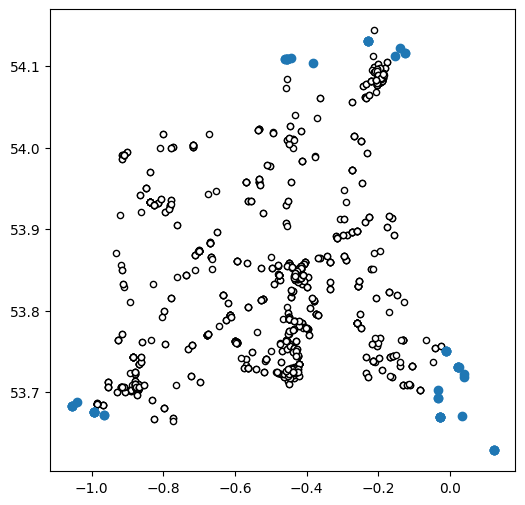

In [107]:
plt.figure(figsize=(6,6))
plt.scatter(yorkshire_outliers['longitude'], yorkshire_outliers['latitude'], c='white', s=20, edgecolor='k')
plt.scatter(if_anomalies_yorkshire['longitude'],if_anomalies_yorkshire['latitude'])

In [108]:
if_anomalies_yorkshire

,longitude,latitude
107,0.023263,53.730483
108,0.023263,53.730483
109,0.023263,53.730483
110,0.023263,53.730483
111,0.023263,53.730483
112,0.025000,53.730660
113,-0.012050,53.750276
114,-0.012050,53.750276
115,-0.012050,53.750276
116,-0.012050,53.750276


In [109]:
print("First 5 rows:") # Get first 5 rows
print(if_anomalies_yorkshire.head())


print("\nLast 5 rows:") # obtain last 5 rows
print(if_anomalies_yorkshire.tail())

# get total number of columns and rows
num_rows, num_cols = if_anomalies_yorkshire.shape
print("\nTotal number of rows:", num_rows)
print("Total number of columns:", num_cols)


First 5 rows:
     longitude   latitude
107   0.023263  53.730483
108   0.023263  53.730483
109   0.023263  53.730483
110   0.023263  53.730483
111   0.023263  53.730483

Last 5 rows:
      longitude   latitude
1167  -1.055770  53.682905
1168  -1.055770  53.682905
1169  -1.055770  53.682905
1170  -1.055770  53.682905
1173  -1.040787  53.687955

Total number of rows: 56
Total number of columns: 2


- A total of 56 outliers were detected for East Riding of Yorkshire region

### Detecting Outliers in the Humberside Region using IsolationForest

In [110]:
humberside_data

,accident_severity,number_of_vehicles,number_of_casualties,road_type,speed_limit,light_conditions,weather_conditions,road_surface_conditions,police_force,latitude,longitude,vehicle_type,sex_of_driver,age_of_driver,engine_capacity_cc,age_of_vehicle,casualty_class,sex_of_casualty,age_of_casualty,pedestrian_location,Region
83508,3,1,1,6,30,4,1,1,16,53.512895,-0.528743,9,1,30,-1,-1,1,1,30,0,Humberside
83509,2,2,1,6,30,1,1,1,16,53.524997,-0.423887,19,2,47,1896,17,1,1,70,0,Humberside
83510,2,2,1,6,30,1,1,1,16,53.524997,-0.423887,1,1,70,-1,-1,1,1,70,0,Humberside
83511,2,3,1,6,60,1,1,1,16,53.520701,-0.450066,9,1,30,2148,16,1,1,45,0,Humberside
83512,2,3,1,6,60,1,1,1,16,53.520701,-0.450066,1,1,45,-1,-1,1,1,45,0,Humberside
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87446,1,3,1,6,30,1,1,1,16,53.602704,-0.679626,9,2,22,1275,21,1,2,74,0,Humberside
87463,3,2,2,6,30,1,1,1,16,53.520707,-0.823599,9,2,22,1984,11,1,2,22,0,Humberside
87464,3,2,2,6,30,1,1,1,16,53.520707,-0.823599,9,2,22,1984,11,1,1,24,0,Humberside
87465,3,2,2,6,30,1,1,1,16,53.520707,-0.823599,9,1,24,1598,13,1,2,22,0,Humberside


In [111]:

# Drop the 'Region' column from Humberside_data
humberside_data = humberside_data.drop(columns=['Region'])

In [112]:
# Create a random number generator
ranst = np.random.RandomState(0)

humberside_outliers = humberside_data[['longitude', 'latitude']]
# Create an instance of the IsolationForest class with specified parameters and fit it to your data
model_humberside = IsolationForest(max_samples=100, random_state=ranst, contamination=0.05)
model_humberside.fit(humberside_outliers)

# Predict anomalies using the trained model and transform the labels for easier interpretation
if_anomalies_humberside = model_humberside.predict(humberside_outliers)
if_anomalies_humberside = pd.Series(if_anomalies_humberside).replace([-1, 1], [1, 0])

# Reset the index of hull_data to ensure alignment with if_anomalies
humberside_outliers_reset = humberside_outliers.reset_index(drop=True)

# Filter out the detected anomalies from the original data
if_anomalies_humberside = humberside_outliers_reset[if_anomalies_humberside == 1]

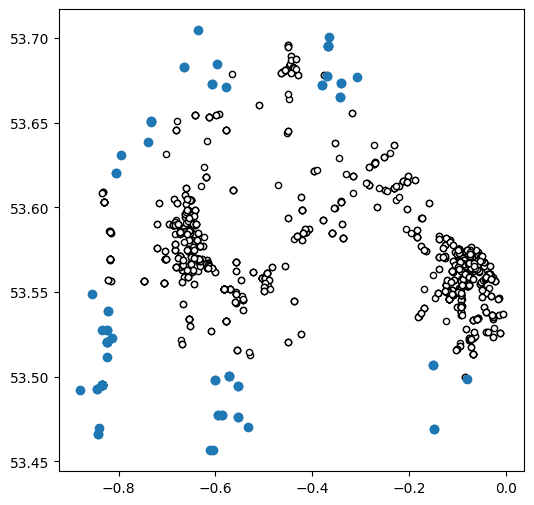

In [113]:
plt.figure(figsize=(6,6))
plt.scatter(humberside_outliers['longitude'], humberside_outliers['latitude'], c='white', s=20, edgecolor='k')
plt.scatter(if_anomalies_humberside['longitude'],if_anomalies_humberside['latitude'])

In [114]:
if_anomalies_humberside

,longitude,latitude
44,-0.806313,53.620510
45,-0.806313,53.620510
186,-0.364669,53.700887
187,-0.367902,53.695609
188,-0.367902,53.695609
...,...,...
1487,-0.577565,53.671189
1514,-0.823599,53.520707
1515,-0.823599,53.520707
1516,-0.823599,53.520707


- For the Humberside Region, we have a total of 75 outliers as detected by the IsolationForest algorithm

- The outliers will be explored further with data clean up carried out to prepare the dataset for building of classification Model which will be used to predict fatal injusries sustained in road trafic accidents

### 7. Can you develop a classification model using the provided data that accurately predicts fatal injuries sustained in road traffic accidents, with the aim of informing and improving road safety measures?

#### Classification Model Using Gradient Boosting

### Data Cleaning
- Use NAN to replace all the negative values -1
- Fill the NAN values with their medians

In [115]:
#using my earlier dataset where the 3 tables were joined
df_classical = main_data.copy()

In [116]:
#replace the negative values with NAN
df4 = df_classical.replace(-1, np.nan)

In [117]:
#Sanity check yo confirm that the NaN has replaced the -1
df4

,accident_severity,number_of_vehicles,number_of_casualties,road_type,speed_limit,light_conditions,weather_conditions,road_surface_conditions,police_force,latitude,longitude,vehicle_type,sex_of_driver,age_of_driver,engine_capacity_cc,age_of_vehicle,casualty_class,sex_of_casualty,age_of_casualty,pedestrian_location,Region
83493,3,2,1,6,30,1,1,1.0,16,53.744936,-0.393424,9,1,24.0,1248.0,11.0,1,1.0,24.0,0,Hull
83494,3,2,1,6,30,1,1,1.0,16,53.744936,-0.393424,19,1,48.0,1968.0,5.0,1,1.0,24.0,0,Hull
83495,3,2,1,3,30,1,1,2.0,16,53.744520,-0.400627,9,2,34.0,1997.0,4.0,1,1.0,61.0,0,Hull
83496,3,2,1,3,30,1,1,2.0,16,53.744520,-0.400627,1,1,61.0,NaN,NaN,1,1.0,61.0,0,Hull
83497,3,2,1,6,30,4,1,1.0,16,53.744482,-0.400523,9,2,22.0,1461.0,4.0,1,1.0,59.0,0,Hull
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87473,3,5,1,6,30,4,1,2.0,16,53.843568,-0.408728,9,3,NaN,NaN,NaN,1,1.0,29.0,0,Yorkshire
87474,3,5,1,6,30,4,1,2.0,16,53.843568,-0.408728,9,3,NaN,NaN,NaN,1,1.0,29.0,0,Yorkshire
87475,3,5,1,6,30,4,1,2.0,16,53.843568,-0.408728,9,3,NaN,NaN,NaN,1,1.0,29.0,0,Yorkshire
87476,3,2,1,6,30,1,1,1.0,16,53.743858,-0.428826,1,1,10.0,NaN,NaN,1,1.0,10.0,0,Yorkshire


#### Clean the continous variables

In [118]:
#replace the NAN

def fillnaofmissingvalues(col, df):
    df[col].fillna(df[col].median(), inplace = True)
    return df

In [119]:
#clean age of vehicle
df4 = fillnaofmissingvalues('age_of_vehicle', df4)

In [120]:
#sanity checks using .describe to ensure that there is no negative value
df4['age_of_vehicle'].describe()

count    3985.000000
mean        8.489084
std         4.972055
min         0.000000
25%         5.000000
50%         8.000000
75%        11.000000
max        88.000000
Name: age_of_vehicle, dtype: float64

In [121]:
#clean age of engine capacity
df4 = fillnaofmissingvalues('engine_capacity_cc', df4)

In [122]:
#Checking the descriptive property of the column 'engine_capacity_cc'
df4['engine_capacity_cc'].describe()

count     3985.000000
mean      1836.749812
std       1638.037155
min         48.000000
25%       1395.000000
50%       1591.000000
75%       1896.000000
max      16400.000000
Name: engine_capacity_cc, dtype: float64

In [123]:
#clean age of age of driver
df4 = fillnaofmissingvalues('age_of_driver', df4)

In [124]:
#Checking the descriptive property of the column 'age_of_driver'
df4['age_of_driver'].describe()

count    3985.000000
mean       39.728231
std        15.912101
min         5.000000
25%        29.000000
50%        37.000000
75%        49.000000
max        93.000000
Name: age_of_driver, dtype: float64

In [125]:
#Sanity checks on my dataframe df4
df4.isna().sum()

accident_severity            0
number_of_vehicles           0
number_of_casualties         0
road_type                    0
speed_limit                  0
light_conditions             0
weather_conditions           0
road_surface_conditions      2
police_force                 0
latitude                     0
longitude                    0
vehicle_type                 0
sex_of_driver                0
age_of_driver                0
engine_capacity_cc           0
age_of_vehicle               0
casualty_class               0
sex_of_casualty              4
age_of_casualty            161
pedestrian_location          0
Region                       0
dtype: int64

In [134]:
#clean age of age of casualty
df4 = fillnaofmissingvalues('age_of_casualty', df4)

In [135]:
#clean age of age of casualty
df4 = fillnaofmissingvalues('road_surface_conditions', df4)

In [136]:
#clean age of age of casualty
df4 = fillnaofmissingvalues('sex_of_casualty', df4)

In [137]:
#Sanity checks on my dataframe df4
df4.isna().sum()

accident_severity          0
number_of_vehicles         0
number_of_casualties       0
road_type                  0
speed_limit                0
light_conditions           0
weather_conditions         0
road_surface_conditions    0
police_force               0
latitude                   0
longitude                  0
vehicle_type               0
sex_of_driver              0
age_of_driver              0
engine_capacity_cc         0
age_of_vehicle             0
casualty_class             0
sex_of_casualty            0
age_of_casualty            0
pedestrian_location        0
Region                     0
dtype: int64

- There is no NaN values on my dataset

In [138]:
#check for duplication in my dataset
df4.duplicated().sum()

52

In [139]:
# Remove duplicates from the DataFrame
df4 = df4.drop_duplicates()

In [140]:
# perform sanity check
df4.duplicated().sum()

0

### Data Pre-processing

In [ ]:
df4

In [141]:
#check the make up of the classes
df4.accident_severity.value_counts()

3    3091
2     768
1      74
Name: accident_severity, dtype: int64

- Please note that from the accident form, 1 is the fatal class among the 3 classes of 1,2 and 3

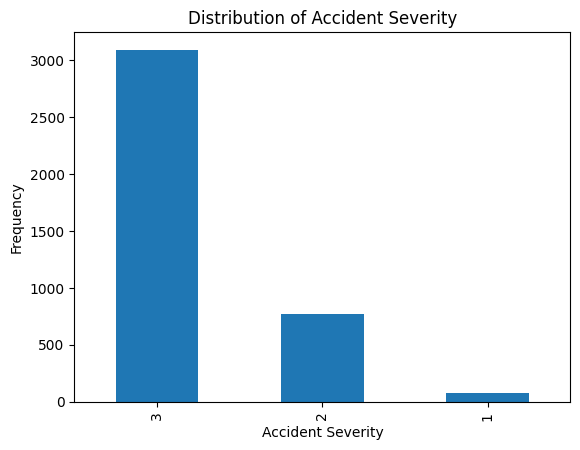

In [142]:
import matplotlib.pyplot as plt

# Visualizing accident_severity to understand the classes of accident_severity
df4['accident_severity'].value_counts().plot(kind='bar')
plt.title('Distribution of Accident Severity')
plt.xlabel('Accident Severity')
plt.ylabel('Frequency')
plt.show()


This showed that the data is imbalanced. However, I will have to build and train the model without balancing the data to understand the performance and any improvement that will be notcided after balancing the data

In [143]:
# Feature Slection

# dropping accident_severity which is my target and Region column which may not contribute much
x = df4.drop(['accident_severity', 'Region', 'police_force'], axis=1)
y = df4['accident_severity']


In [144]:
#data spliting into training and testing
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.3, random_state=0, stratify=y,shuffle=True)

In [145]:
#check the shape of x_train
x_train.shape

(2753, 18)

In [ ]:
x_test.shape

### Model Building and Training

In [147]:
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier

In [148]:
#create instance of gradient boosting with default parameters
gb = GradientBoostingClassifier()

#model training

gb.fit(x_train, y_train)

GradientBoostingClassifier()

- Becasue the Data is imbalance, I will concentrate on metrics like recall, precision and f1-score and not on accuracy
- The reason for not using accuracy as a majir metrics is because it is going to be biased to the majority class which is class 3

### Evaluation Metrics of the Model

In [149]:
#import evaluation metrics libraries
from sklearn.metrics import classification_report, confusion_matrix

In [150]:
#model pridiction on the test

gb_predict = gb.predict(x_test)


In [151]:
#compute confusion matrix

cnf = confusion_matrix(y_test, gb_predict)

In [152]:
# display the classification report

class_report = classification_report(y_test, gb_predict, target_names=['Fatal', 'Serious', 'Slight'])

In [153]:
print(f'Classification Report: \n{class_report}')

Classification Report: 
              precision    recall  f1-score   support

       Fatal       0.67      0.36      0.47        22
     Serious       0.76      0.30      0.43       231
      Slight       0.84      0.98      0.90       927

    accuracy                           0.83      1180
   macro avg       0.76      0.55      0.60      1180
weighted avg       0.82      0.83      0.80      1180



- The class we are interested in which is Fatal(class 1) showed poor performance on precission, recall and f1-score while class 3 which is Slight recorded good performces on all metrics.
- The Fatal class recorded, 67% of precision, 36% of recall and 47% of f1-score while Slight which is the majority class recorded 84% for precision, 98% for recall and 90% for f1-score.
- The precision is saying that out of the total number of Fatal accident predicted from the dataset, the model is able to make 67% prediction correctly.
- The reccall is saying that my model is able to identify only 36% of the actual positive instances correctly
- My recall for the Fatal class which is 35% is an overall assessment of my model's ability to balance between true positives and minimizing false positives/negatives.
- These poor results are  due to data imbalance in my dataset
- I will carry out data balancing to rebuild the model

### Balance the Data To Rebuild The Model

In [154]:
#import SMOTE library
from imblearn.over_sampling import SMOTE

In [155]:
#usining SMOTE data balancing method
sm = SMOTE(random_state = 0) # create instance of SMOT

In [156]:
#feature and target performance
x_sm,y_sm = sm.fit_resample(x,y)

In [157]:
y_sm.value_counts()

3    3091
2    3091
1    3091
Name: accident_severity, dtype: int64

- The data is now balanced. The next is to rebuild the model

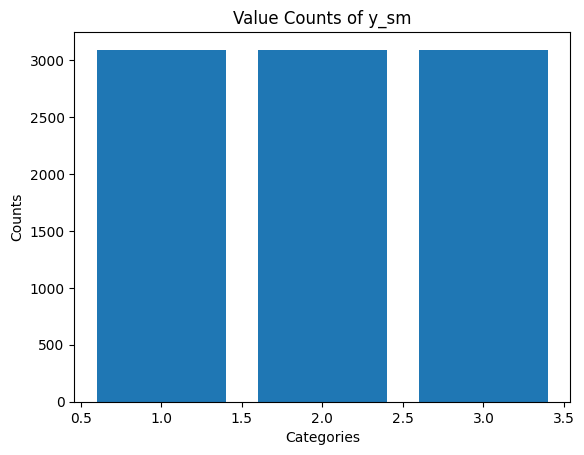

In [158]:

# Visualizing the balanced accident_severity data

y_sm_counts = y_sm.value_counts()

# Create a bar plot
plt.bar(y_sm_counts.index, y_sm_counts.values)

# Insert labels and title
plt.xlabel('Categories')
plt.ylabel('Counts')
plt.title('Value Counts of y_sm')

# display the plot
plt.show()


- This showed me a balanced data which I can use to rebuild the model

### Rebuild and Train the model

In [159]:
#respliting of the data
x_train_sm, x_test_sm, y_train_sm, y_test_sm = train_test_split(x_sm,y_sm, test_size=0.3, random_state=0,shuffle=True)

In [160]:
#create instance of gradient boosting after data balancing
gb_sm = GradientBoostingClassifier()

#model training

gb_sm.fit(x_train_sm, y_train_sm)

GradientBoostingClassifier()

In [164]:
#make prediction
gb_sm_pred = gb_sm.predict(x_test_sm)

In [165]:
#compute confusion matrix

cnf_sm = confusion_matrix(y_test_sm, gb_sm_pred)

In [166]:
# display the classification report

class_report_sm = classification_report(y_test_sm, gb_sm_pred, target_names=['Fatal', 'Serious', 'Slight'])

In [167]:
print(f'Classification Report: \n{class_report_sm}')

Classification Report: 
              precision    recall  f1-score   support

       Fatal       0.92      0.94      0.93       955
     Serious       0.88      0.72      0.79       918
      Slight       0.79      0.91      0.85       909

    accuracy                           0.86      2782
   macro avg       0.86      0.86      0.86      2782
weighted avg       0.86      0.86      0.86      2782



- My model performed better with 92% precision, 94% recall and 93% f1-score
- The performance in my Fatal class performed better than other classes in predicting Fatal injuries sustained in road accident traffics which can help with informing and improving road safety measures

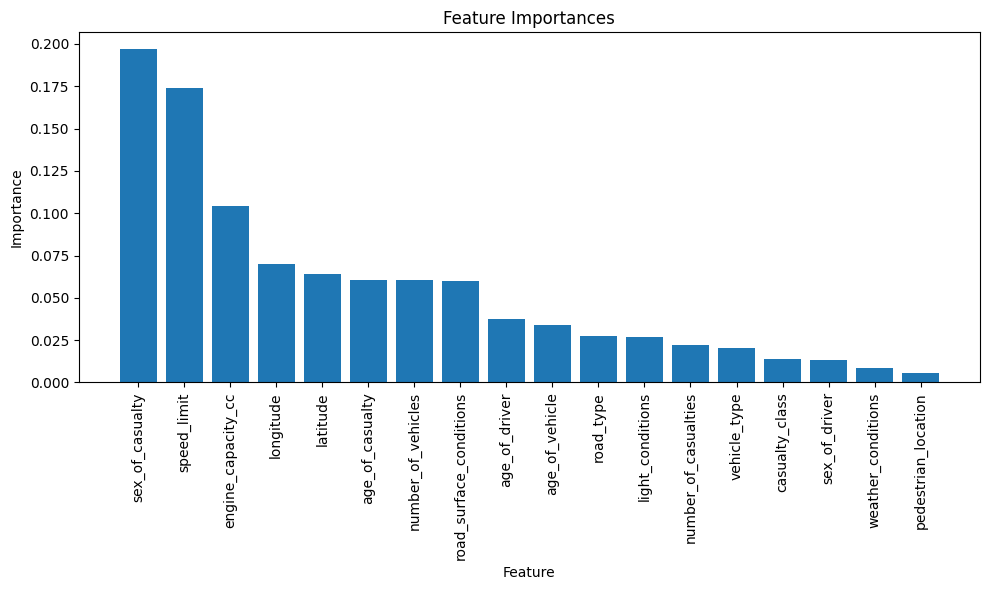

In [168]:
# Extract feature importances
feature_importances = gb_sm.feature_importances_

# Create a DataFrame to store feature importances and their corresponding feature names
importance_df = pd.DataFrame({'Feature': x_train_sm.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance in descending order
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Plot the feature importances as bar charts
plt.figure(figsize=(10, 6))
plt.bar(importance_df['Feature'], importance_df['Importance'])
plt.xticks(rotation=90)
plt.title('Feature Importances')
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.tight_layout()
plt.show()

- The feature of importance showed that all the variables are importance in the building of this model. They all contributed something to make the model better.
- The performance of the evaluation metrics carried out proved that.

### Summary of ther Eavaluation Performance of my Model

The classification report contains a detailed summary of my model's performance. It demonstrates that my model achieves high precision (92%) for the 'Fatal' class, suggesting that when it predicts a 'Fatal' occurrence, it is correct 92% of the time. The recall (or sensitivity) is likewise strong at 94%, indicating that my model correctly recognises 94% of all 'Fatal' events. The F1-score, which measures the balance of precision and recall, is 93%, suggesting a great overall performance. The report is based on 928 incidents in total. These findings demonstrate the model's capacity to efficiently discriminate 'Fatal' instances while minimising false negatives and positives.

### Save My Model For Deployment

In [169]:
# Save the trained model to a file
import joblib

accident_prediction = 'accident_prediction.pkl'
joblib.dump(gb_sm, accident_prediction)

print("Model saved as", accident_prediction)

Model saved as accident_prediction.pkl
